In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv("C:/Users/surendar.reddy/Documents/data Science projet_Data traine/DataTrained_Project_Week-1/Evaluation_Week1/Telecom_customer_churn.csv",sep=' *, *')

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [3]:
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
5,9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.50,Yes
6,1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.40,No
7,6713-OKOMC,Female,0,No,No,10,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.90,No
8,7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes
9,6388-TABGU,Male,0,No,Yes,62,Yes,No,DSL,Yes,Yes,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No


In [4]:
df.info()
# missing data on Total charges

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [5]:
categorial_features = df.select_dtypes(include=[np.object])
#frequency of categories
for col in categorial_features:
    print(df[col].value_counts())
    
#customerID-Do not contribute significant information to the, there are just indexes to the dat

7590-VHVEG    1
3791-LGQCY    1
6008-NAIXK    1
5956-YHHRX    1
5365-LLFYV    1
5855-EIBDE    1
8166-ZZTFS    1
0129-KPTWJ    1
9128-CPXKI    1
9509-MPYOD    1
0594-UFTUL    1
0463-TXOAK    1
0265-PSUAE    1
7036-ZZKBD    1
1928-BXYIV    1
2832-SCUCO    1
2988-GBIVW    1
3647-GMGDH    1
8024-XNAFQ    1
0345-XMMUG    1
6305-YLBMM    1
9360-OMDZZ    1
0504-HHAPI    1
9965-YOKZB    1
1986-PHGZF    1
8218-FFJDS    1
2956-GGUCQ    1
5760-FXFVO    1
3049-SOLAY    1
0362-ZBZWJ    1
7813-ZGGAW    1
6522-OIQSX    1
6119-SPUDB    1
3154-HMWUU    1
2192-CKRLV    1
1541-ETJZO    1
5073-RZGBK    1
4274-OWWYO    1
7581-EBBOU    1
4211-MMAZN    1
8979-CAMGB    1
3556-BVQGL    1
6595-COKXZ    1
9356-AXGMP    1
5176-OLSKT    1
7508-DQAKK    1
0016-QLJIS    1
7544-ZVIKX    1
7550-WIQVA    1
5871-DGTXZ    1
7816-VGHTO    1
4007-NHVHI    1
5181-OABFK    1
0961-ZWLVI    1
3006-XIMLN    1
8443-WVPSS    1
3011-WQKSZ    1
1269-FOYWN    1
7396-VJUZB    1
5032-MIYKT    1
5219-YIPTK    1
5701-ZIKJE    1
1230-QAJ

In [6]:
#Droping Columns which do not have any significant information, just unique indexes in all the customers
df=df.drop(columns=['customerID'],axis=1)

In [7]:
print(df.isnull().sum())

gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64


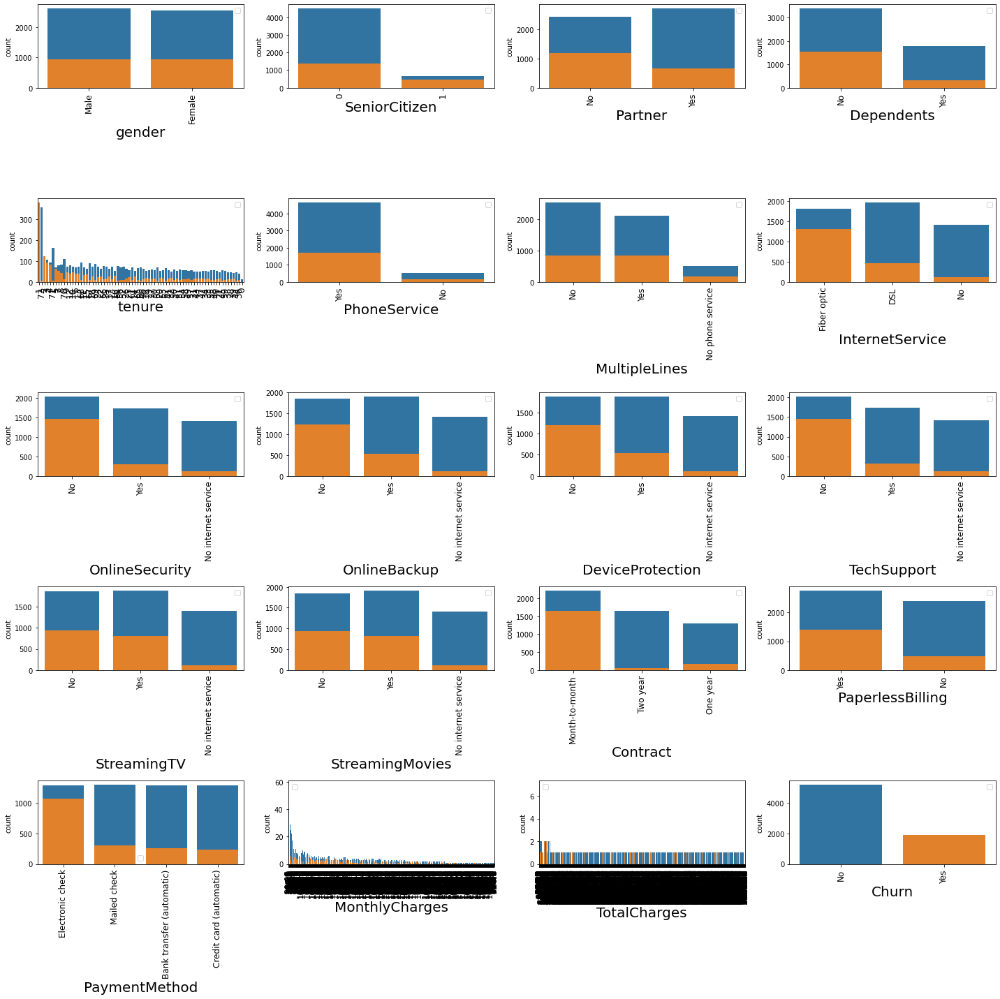

In [8]:
#This will show what are the catogories which are the most inflencing the chun of the customers
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in df:
    if plotnumber<=20:
        ax=plt.subplot(5,4,plotnumber)
        
        sns.countplot(x=df[column], data=df,order=df[column].value_counts().index,hue='Churn',dodge=False)
        plt.xlabel(column,fontsize=20)
        plt.xticks(size=12, rotation=90)
        plt.legend([],[], frameon=True)
      
    plotnumber+=1
plt.tight_layout() 

### Custermer understanding
#chuning does not depend on the Gender

#Less percent of Senour citizen chunned/Or of the seniour citized retain there connection

#People with dependends and parteners chur less/retained more

#People who have internet service,  internet security,online backup, device protection, tech support are chuned more

#people who have more electronic checks ahun more/retained less

#People with 1 month subcription chun moe/than with people having longer subcriptions

#Peoplle who make paper billing chun lot


In [9]:
df = df.replace({'Yes':1,'No':0,'No internet service':3,'No phone service':3, 'Male':1, 'Female':0,'Fiber optic':1, 'DSL':2})

In [10]:
from sklearn import preprocessing
LE=preprocessing.LabelEncoder()

df['PaymentMethod']=LE.fit_transform(df['PaymentMethod'])
df['Contract']=LE.fit_transform(df['Contract'])

In [11]:
df

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,0,3,2,0,1,0,0,0,0,0,1,2,29.85,29.85,0
1,1,0,0,0,34,1,0,2,1,0,1,0,0,0,1,0,3,56.95,1889.50,0
2,1,0,0,0,2,1,0,2,1,1,0,0,0,0,0,1,3,53.85,108.15,1
3,1,0,0,0,45,0,3,2,1,0,1,1,0,0,1,0,0,42.30,1840.75,0
4,0,0,0,0,2,1,0,1,0,0,0,0,0,0,0,1,2,70.70,151.65,1
5,0,0,0,0,8,1,1,1,0,0,1,0,1,1,0,1,2,99.65,820.50,1
6,1,0,0,1,22,1,1,1,0,1,0,0,1,0,0,1,1,89.10,1949.40,0
7,0,0,0,0,10,0,3,2,1,0,0,0,0,0,0,0,3,29.75,301.90,0
8,0,0,1,0,28,1,1,1,0,0,1,1,1,1,0,1,2,104.80,3046.05,1
9,1,0,0,1,62,1,0,2,1,1,0,0,0,0,1,0,0,56.15,3487.95,0


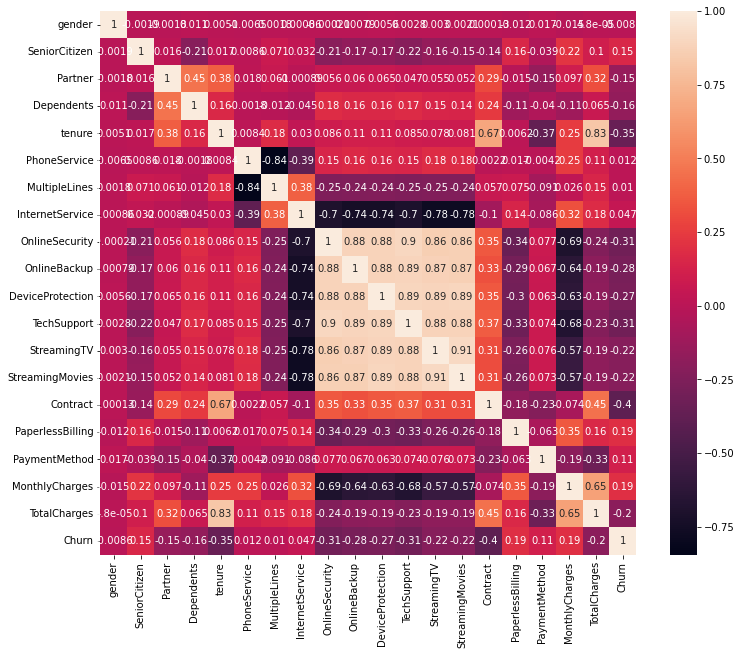

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
gender,1.000000,-0.001874,-0.001808,0.010517,0.005106,-0.006488,0.001806,0.000863,-0.000214,0.000788,0.005642,0.002805,0.002992,0.002082,0.000126,-0.011754,0.017352,-0.014569,0.000048,-0.008612
SeniorCitizen,-0.001874,1.000000,0.016479,-0.211185,0.016567,0.008576,0.071049,0.032310,-0.208709,-0.170002,-0.172926,-0.217566,-0.155266,-0.149000,-0.142554,0.156530,-0.038551,0.220173,0.102411,0.150889
Partner,-0.001808,0.016479,1.000000,0.452676,0.379697,0.017706,0.061417,-0.000891,0.056157,0.059540,0.064584,0.047420,0.054605,0.051632,0.294806,-0.014877,-0.154798,0.096848,0.319072,-0.150448
Dependents,0.010517,-0.211185,0.452676,1.000000,0.159712,-0.001762,-0.011900,-0.044590,0.179614,0.161106,0.157003,0.173036,0.146505,0.136652,0.243187,-0.111377,-0.040292,-0.113890,0.064653,-0.164221
tenure,0.005106,0.016567,0.379697,0.159712,1.000000,0.008448,0.176459,0.030359,0.085500,0.107643,0.107656,0.084902,0.078087,0.081169,0.671607,0.006152,-0.370436,0.247900,0.825880,-0.352229
PhoneService,-0.006488,0.008576,0.017706,-0.001762,0.008448,1.000000,-0.844955,-0.387436,0.146522,0.164540,0.156631,0.145215,0.179510,0.175257,0.002247,0.016505,-0.004184,0.247398,0.113008,0.011942
MultipleLines,0.001806,0.071049,0.061417,-0.011900,0.176459,-0.844955,1.000000,0.381534,-0.249780,-0.244690,-0.237032,-0.247977,-0.246600,-0.241952,0.057421,0.074580,-0.091086,0.025620,0.148335,0.010389
InternetService,0.000863,0.032310,-0.000891,-0.044590,0.030359,-0.387436,0.381534,1.000000,-0.699300,-0.738294,-0.741403,-0.700957,-0.778186,-0.775790,-0.099721,0.138625,-0.086140,0.323260,0.175691,0.047291
OnlineSecurity,-0.000214,-0.208709,0.056157,0.179614,0.085500,0.146522,-0.249780,-0.699300,1.000000,0.884432,0.883200,0.902492,0.861988,0.863460,0.352177,-0.341703,0.077098,-0.694378,-0.237177,-0.307989
OnlineBackup,0.000788,-0.170002,0.059540,0.161106,0.107643,0.164540,-0.244690,-0.738294,0.884432,1.000000,0.879558,0.885567,0.870863,0.869091,0.326757,-0.294559,0.066991,-0.642246,-0.193094,-0.280770


In [12]:
#Check correlation between the columns

Corr=df.corr()
plt.figure(figsize=(12,10))
sns.heatmap(Corr,annot=True,)
plt.show()
#This plot shows that there is  collinearity between the features and there is very less correlation with the either of the Labels
Corr


#internet service Negivitly correlated to internet security,online backup, device protection, tech support 
#internet security,online backup, device protection, tech support are possitivily correlated to each other
#Phone service and Multiple lines are negitivily correlated to each other

<AxesSubplot:xlabel='MonthlyCharges'>

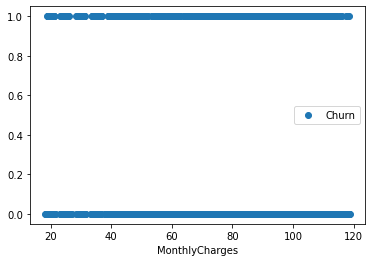

In [13]:
df.plot(x='MonthlyCharges', y='Churn', style='o')
#Monthy charges do not influmnce to retain the customer

<AxesSubplot:xlabel='TotalCharges'>

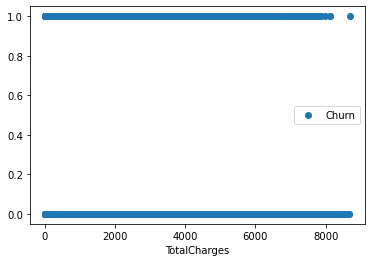

In [14]:
df.plot(x='TotalCharges', y='Churn', style='o')

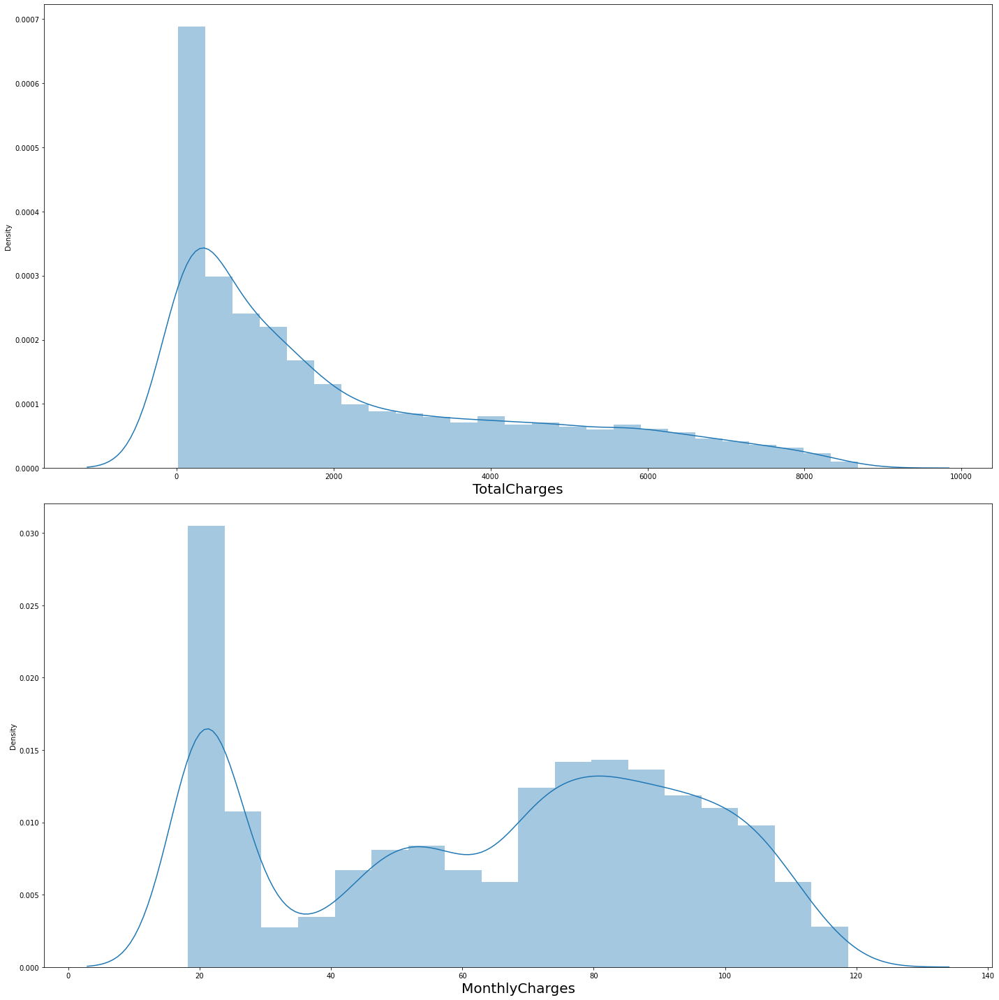

In [15]:
df_numerical=pd.DataFrame({})
df_numerical['TotalCharges']=df['TotalCharges']
df_numerical['MonthlyCharges']=df['MonthlyCharges']
df_numerical['Churn']=df['Churn']
# check the data to understand its distribution
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in df_numerical:
    if plotnumber<=2:
        ax=plt.subplot(2,1,plotnumber)
        sns.distplot(df_numerical[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()  


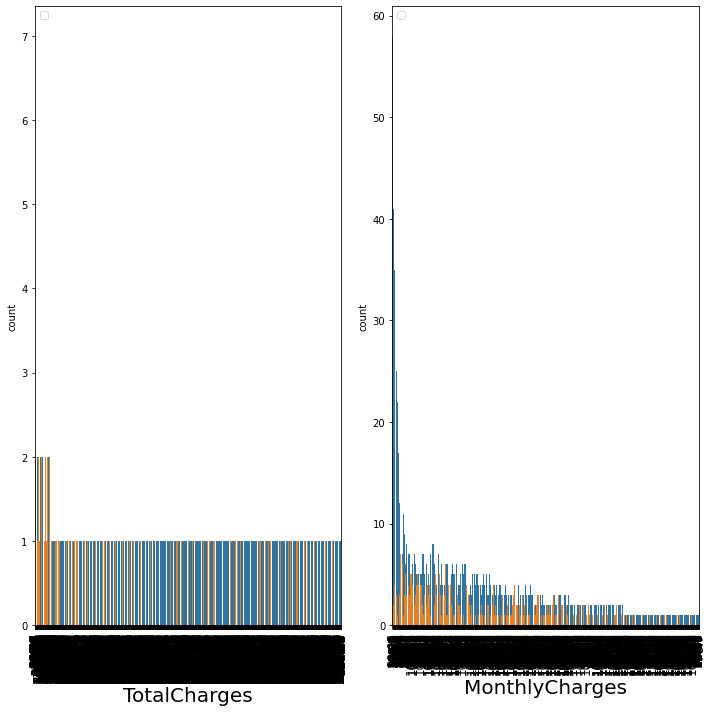

In [16]:
plt.figure(figsize=(10,10),facecolor='white')
plotnumber=1

for column in df_numerical:
    if plotnumber<=2:
        ax=plt.subplot(1,2,plotnumber)
        
        sns.countplot(x=df_numerical[column], data=df_numerical,order=df_numerical[column].value_counts().index,hue='Churn',dodge=False)
        plt.xlabel(column,fontsize=20)
        plt.xticks(size=12, rotation=90)
        plt.legend([],[], frameon=True)
      
    plotnumber+=1
plt.tight_layout() 

In [17]:
#There is  no visible trend for these charges on churn criterea, it looks like people with low Total charges an dmonthly charges are more probable to churn


SyntaxError: invalid syntax (Temp/ipykernel_7648/241660189.py, line 2)

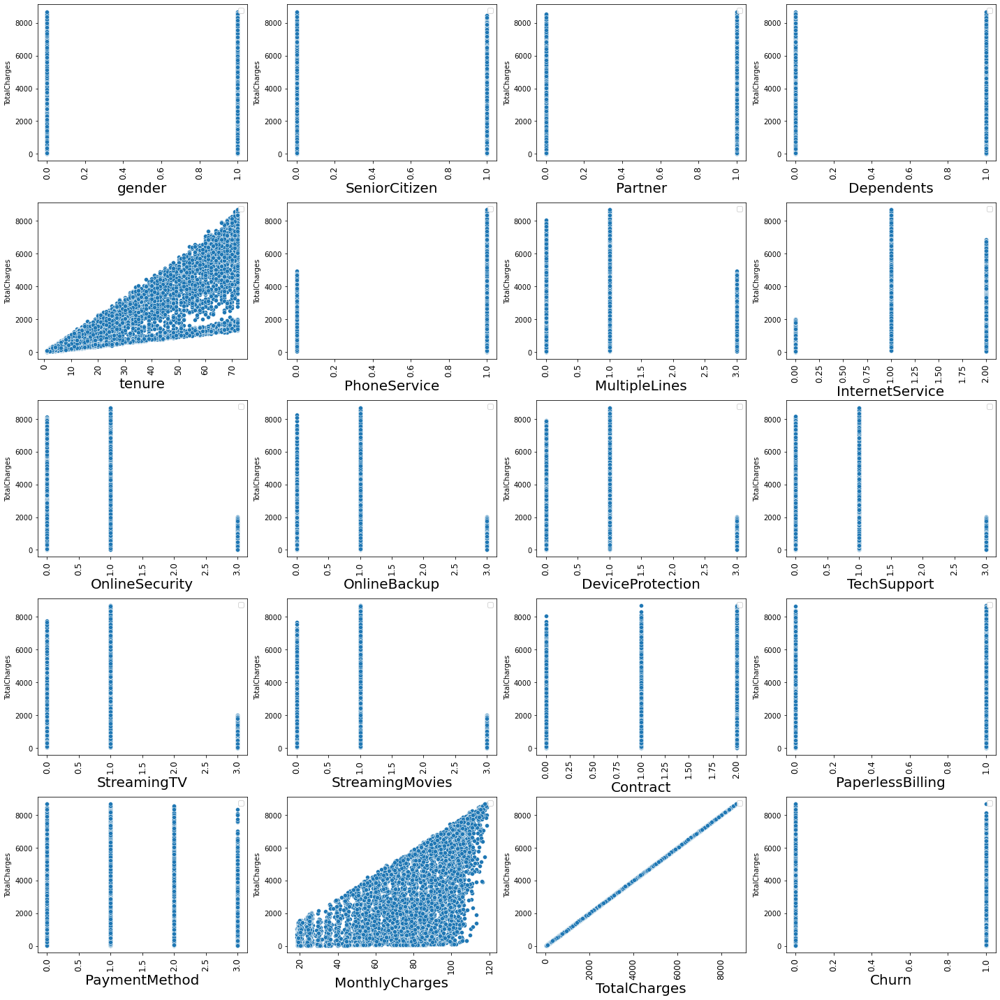

In [22]:
#To check if we can import this data based on any other columns
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in df:
    if plotnumber<=20:
        ax=plt.subplot(5,4,plotnumber)
        
        sns.scatterplot(x=df[column], y=df['TotalCharges'],data=df)
        plt.xlabel(column,fontsize=20)
        plt.xticks(size=12, rotation=90)
        plt.legend([],[], frameon=True)
      
    plotnumber+=1
plt.tight_layout() 

#As Total Charges is collerated with Monthly charges Vs Tenure, We can delete Total charges

In [23]:
df=df.drop(columns=['TotalCharges'],axis=1)

In [25]:
x=df.drop(columns=['Churn'],axis=1)
y=df['Churn']

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns


vif_data["VIF"] = [variance_inflation_factor(x.values, i)
                          for i in range(len(x.columns))]

print(vif_data)


             feature        VIF
0             gender   2.000917
1      SeniorCitizen   1.365854
2            Partner   2.825677
3         Dependents   1.971782
4             tenure   7.340068
5       PhoneService  36.179333
6      MultipleLines   5.056513
7    InternetService   7.807912
8     OnlineSecurity  13.451225
9       OnlineBackup  12.545710
10  DeviceProtection  13.983663
11       TechSupport  14.605692
12       StreamingTV  15.351141
13   StreamingMovies  15.399745
14          Contract   4.088377
15  PaperlessBilling   2.907224
16     PaymentMethod   3.579690
17    MonthlyCharges  25.319866


In [27]:
#We will be able to drop PhoneService,   OnlineSecurity, DeviceProtection, TechSupport,StreamingTV,StreamingMovies,MonthlyCharges
df=df.drop(columns=['PhoneService'],axis=1)
df=df.drop(columns=['OnlineSecurity'],axis=1)
df=df.drop(columns=['DeviceProtection'],axis=1)
df=df.drop(columns=['TechSupport'],axis=1)
df=df.drop(columns=['StreamingTV'],axis=1)
df=df.drop(columns=['StreamingMovies'],axis=1)
df=df.drop(columns=['MonthlyCharges'],axis=1)

KeyError: "['MonthlyCharges '] not found in axis"

In [29]:
x=df.drop(columns=['Churn'],axis=1)
y=df['Churn']

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns


vif_data["VIF"] = [variance_inflation_factor(x.values, i)
                          for i in range(len(x.columns))]

print(vif_data)

             feature       VIF
0             gender  1.936234
1      SeniorCitizen  1.309163
2            Partner  2.793190
3         Dependents  1.964533
4             tenure  5.875003
5      MultipleLines  1.999847
6    InternetService  4.572776
7       OnlineBackup  2.831325
8           Contract  3.714164
9   PaperlessBilling  2.404377
10     PaymentMethod  3.036260


In [30]:
#Checking for the balance in label class
y.value_counts()
#Imbalce and using SMOTE by oversampling the class with less value

0    5174
1    1869
Name: Churn, dtype: int64

In [31]:
#As the Label is imbalance, Will balance it using SMOTE
from imblearn.over_sampling import SMOTE
oversample=SMOTE(0.8,k_neighbors=5)
x_smoted, y_smoted=oversample.fit_resample(x,y)
# summarize distribution
counter = y_smoted.value_counts()
for k,v in counter.items():
    per = v / len(y_smoted) * 100
    print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
    
#THE dataSET IS BALANCED NOW, 

Class=0, n=5174 (55.557%)
Class=1, n=4139 (44.443%)


In [32]:
#Scalar the data
scaler=StandardScaler()
x_scaled=scaler.fit_transform(x_smoted)
x_scaled.shape

(9313, 11)

In [33]:
#Train the data to the model
x_train, x_test, y_train, y_test=train_test_split(x_scaled,y_smoted,test_size=0.25, random_state=100)

In [34]:
from sklearn.ensemble import RandomForestClassifier
RF=RandomForestClassifier()
RF.fit(x_train,y_train)
y_pred=RF.predict(x_test)
print(classification_report(y_test,y_pred,digits=2))

              precision    recall  f1-score   support

           0       0.84      0.82      0.83      1309
           1       0.77      0.80      0.79      1020

    accuracy                           0.81      2329
   macro avg       0.81      0.81      0.81      2329
weighted avg       0.81      0.81      0.81      2329



In [42]:
from sklearn.linear_model import LogisticRegression
LG=LogisticRegression()
LG.fit(x_train,y_train)
y_pred=LG.predict(x_test)
print(classification_report(y_test,y_pred,digits=2))

              precision    recall  f1-score   support

           0       0.81      0.77      0.79      1309
           1       0.73      0.77      0.75      1020

    accuracy                           0.77      2329
   macro avg       0.77      0.77      0.77      2329
weighted avg       0.78      0.77      0.77      2329



In [43]:
from sklearn.svm import SVC
svc=SVC()
svc.fit(x_train,y_train)
y_pred=svc.predict(x_test)
print(classification_report(y_test,y_pred,digits=2))

              precision    recall  f1-score   support

           0       0.84      0.77      0.80      1309
           1       0.73      0.81      0.77      1020

    accuracy                           0.79      2329
   macro avg       0.78      0.79      0.78      2329
weighted avg       0.79      0.79      0.79      2329



In [44]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()
knn.fit(x_train,y_train)
y_pred=knn.predict(x_test)

print(classification_report(y_test,y_pred,digits=2))

              precision    recall  f1-score   support

           0       0.82      0.78      0.80      1309
           1       0.73      0.78      0.76      1020

    accuracy                           0.78      2329
   macro avg       0.78      0.78      0.78      2329
weighted avg       0.78      0.78      0.78      2329



In [45]:
from sklearn.tree import DecisionTreeClassifier
clf=DecisionTreeClassifier()
clf.fit(x_train,y_train)
y_pred=clf.predict(x_test)
print(classification_report(y_test,y_pred,digits=2))

              precision    recall  f1-score   support

           0       0.83      0.77      0.80      1309
           1       0.73      0.79      0.76      1020

    accuracy                           0.78      2329
   macro avg       0.78      0.78      0.78      2329
weighted avg       0.79      0.78      0.78      2329



## Will Choose SVC as the model

In [46]:
params={'C':[ 1, 3, 5, 7, 8,  12, 15, 18, 20],
   'gamma':[0.1, 0.4, 0.8, 1]}
GSCV=GridSearchCV(svc,params)
GSCV.fit(x_train,y_train)
GSCV.best_params_

{'C': 3, 'gamma': 0.1}

In [47]:
from sklearn.svm import SVC
svc=SVC(C=3, gamma=0.1)
svc.fit(x_train,y_train)
y_pred=svc.predict(x_test)
print(classification_report(y_test,y_pred,digits=2))

              precision    recall  f1-score   support

           0       0.83      0.78      0.80      1309
           1       0.74      0.80      0.76      1020

    accuracy                           0.79      2329
   macro avg       0.78      0.79      0.78      2329
weighted avg       0.79      0.79      0.79      2329



In [49]:
#Cross Validation
from sklearn.model_selection import KFold,cross_val_score
k_f=KFold(n_splits=5, shuffle=True)
k_f

from sklearn.metrics import accuracy_score
k=5
acc_score = []

for train_index , test_index in k_f.split(x_scaled):
    x_train , x_test = x_scaled[train_index,:],x_scaled[test_index,:]
    y_train , y_test = y_smoted[train_index] , y_smoted[test_index]
     
    svc.fit(x_train,y_train)
    pred_values = svc.predict(x_test)
     
    acc = metrics.r2_score(y_test,pred_values)
    acc_score.append(acc)
     
avg_acc_score = sum(acc_score)/k
 
print('accuracy of each fold - {}'.format(acc_score))
print('Avg accuracy : {}'.format(avg_acc_score))
print(classification_report(y_test,pred_values,digits=2))

accuracy of each fold - [0.14308621014902845, 0.1022792022792024, 0.1287372300075481, 0.12071768796937554, 0.104824325077572]
Avg accuracy : 0.1199289310965453
              precision    recall  f1-score   support

           0       0.81      0.76      0.79      1006
           1       0.74      0.79      0.77       856

    accuracy                           0.78      1862
   macro avg       0.78      0.78      0.78      1862
weighted avg       0.78      0.78      0.78      1862



## The MOdel is not overfitting

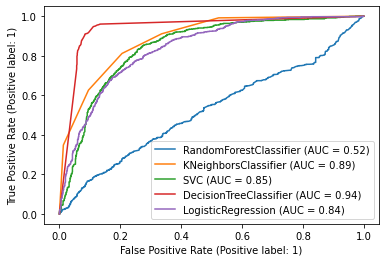

In [50]:
#ROC CURVE COMPARING WITH OTHER MODELS
from sklearn.metrics import plot_roc_curve

classifiers = [RF,knn,svc,clf,LG, ]
ax = plt.gca()
for i in classifiers:
    plot_roc_curve(i, x_test, y_test, ax=ax)

In [51]:
#Cross Validation
from sklearn.model_selection import KFold,cross_val_score
k_f=KFold(n_splits=5, shuffle=True)
k_f

from sklearn.metrics import accuracy_score
k=5
acc_score = []

for train_index , test_index in k_f.split(x_scaled):
    x_train , x_test = x_scaled[train_index,:],x_scaled[test_index,:]
    y_train , y_test = y_smoted[train_index] , y_smoted[test_index]
     
    clf.fit(x_train,y_train)
    pred_values = clf.predict(x_test)
     
    acc = metrics.r2_score(y_test,pred_values)
    acc_score.append(acc)
     
avg_acc_score = sum(acc_score)/k
 
print('accuracy of each fold - {}'.format(acc_score))
print('Avg accuracy : {}'.format(avg_acc_score))
print(classification_report(y_test,pred_values,digits=2))

accuracy of each fold - [0.07129046835908925, 0.05051421304013404, 0.05521576100319625, 0.15680597706448174, 0.15440803266026704]
Avg accuracy : 0.09764689042543366
              precision    recall  f1-score   support

           0       0.81      0.80      0.80      1007
           1       0.77      0.78      0.77       855

    accuracy                           0.79      1862
   macro avg       0.79      0.79      0.79      1862
weighted avg       0.79      0.79      0.79      1862



In [53]:
with open("svc", "wb") as f:
    pickle.dump(svc, f)

In [52]:
with open("clf", "wb") as f:
    pickle.dump(clf, f)

In [ ]:
#These two models based on the accuracy scores and ROC cures, Dession tree is AOC is large so saving the model